# Installing the Dependencies

In [1]:
#!pip install pandas numpy seaborn matplotlib wordcloud scipy plotly

## Importing the Dependencies

In [2]:
import numpy as np  
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from scipy import signal
import plotly.graph_objects as go

# Exploratory Data Analysis

In [3]:
data = pd.read_csv('Global Terrorism Database/globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')
data.head()

C:\Users\talha\AppData\Local\Temp\ipykernel_51028\2244220814.py:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('Global Terrorism Database/globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [5]:
data = data[['iyear','country_txt','city','region_txt','attacktype1_txt','weaptype1_txt','targtype1_txt', 'gname']]
data.head()

,iyear,country_txt,city,region_txt,attacktype1_txt,weaptype1_txt,targtype1_txt,gname
0,1970,Dominican Republic,Santo Domingo,Central America & Caribbean,Assassination,Unknown,Private Citizens & Property,MANO-D
1,1970,Mexico,Mexico city,North America,Hostage Taking (Kidnapping),Unknown,Government (Diplomatic),23rd of September Communist League
2,1970,Philippines,Unknown,Southeast Asia,Assassination,Unknown,Journalists & Media,Unknown
3,1970,Greece,Athens,Western Europe,Bombing/Explosion,Explosives,Government (Diplomatic),Unknown
4,1970,Japan,Fukouka,East Asia,Facility/Infrastructure Attack,Incendiary,Government (Diplomatic),Unknown


In [6]:
#Renaming Columns
data=data.rename(columns = {'iyear':'Year','country_txt':'Country','city':'City','region_txt':'Region','attacktype1_txt':'Attack_Type','weaptype1_txt':'Weapon_Type',
                            'targtype1_txt':'Target_Type','gname':'Affiliation'})
data.head()

,Year,Country,City,Region,Attack_Type,Weapon_Type,Target_Type,Affiliation
0,1970,Dominican Republic,Santo Domingo,Central America & Caribbean,Assassination,Unknown,Private Citizens & Property,MANO-D
1,1970,Mexico,Mexico city,North America,Hostage Taking (Kidnapping),Unknown,Government (Diplomatic),23rd of September Communist League
2,1970,Philippines,Unknown,Southeast Asia,Assassination,Unknown,Journalists & Media,Unknown
3,1970,Greece,Athens,Western Europe,Bombing/Explosion,Explosives,Government (Diplomatic),Unknown
4,1970,Japan,Fukouka,East Asia,Facility/Infrastructure Attack,Incendiary,Government (Diplomatic),Unknown


In [7]:
#Dropping duplicate rows and keeping the first duplicate row
data = data.drop_duplicates(keep='first')
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 128545 entries, 0 to 181690
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Year         128545 non-null  int64 
 1   Country      128545 non-null  object
 2   City         128314 non-null  object
 3   Region       128545 non-null  object
 4   Attack_Type  128545 non-null  object
 5   Weapon_Type  128545 non-null  object
 6   Target_Type  128545 non-null  object
 7   Affiliation  128545 non-null  object
dtypes: int64(1), object(7)
memory usage: 8.8+ MB


C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498:

<Figure size 1000x600 with 0 Axes>

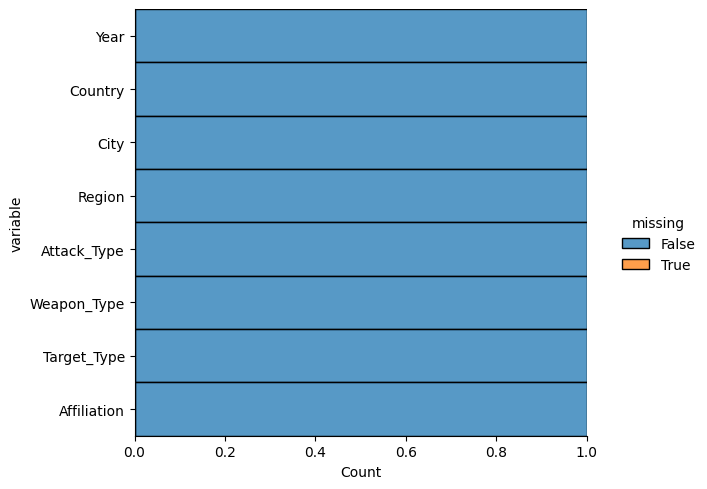

In [8]:
#Determining Which Variables Have Missing Values
plt.figure(figsize=(10,6))
sns.displot(
    data=data.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)
plt.savefig("visualizing_missing_data_with_barplot_Seaborn_distplot.png", dpi=100)

## Number of Terrorist Attacks Each Year

In [9]:
#!pip install nbformat --upgrade

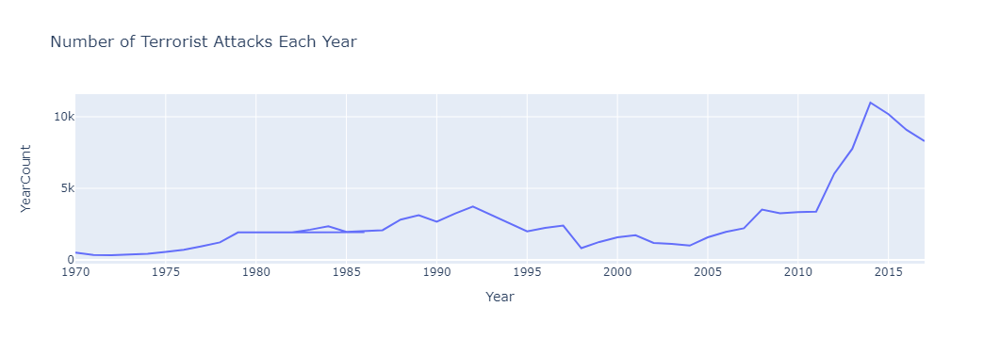

In [10]:
#Making a new column called YearCount which is the sum of the number of terrorist attacks for each year and additing it to dataframe
data['YearCount'] = data.Year.groupby(data.Year).transform('count')

#Creating new Dataframe to get only Year and YearCount and dropping duplicates from Year
data1 = data.copy()
data2 = data1[['Year','YearCount']]
data3 = data2.drop_duplicates(keep='first')

#Line Graph
fig = px.line(data3, x="Year", y="YearCount", title='Number of Terrorist Attacks Each Year')
fig.update_xaxes(range = [1970,2017])
fig.show()

## Terrorist Attacks by Region 

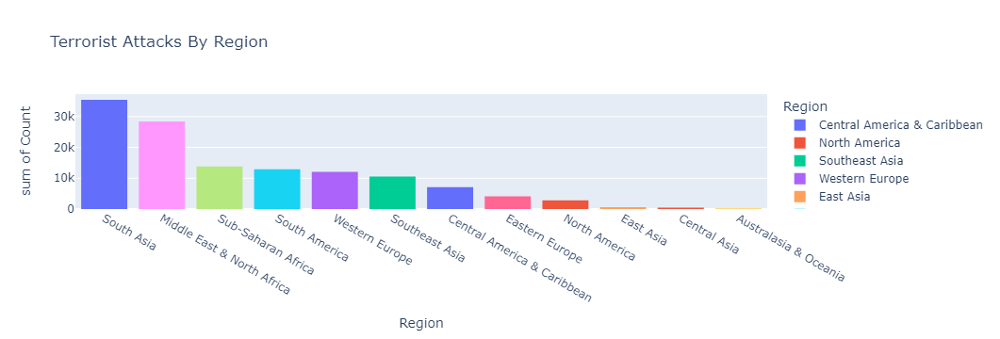

In [11]:
#Making a new column called RegionCount which only has value of 1 for each row - this way histogram will sum up values correctly
data['RegionCount'] = 1

#Histogram
fig = px.histogram(data, x="Region", y="RegionCount", color="Region", 
                   title="Terrorist Attacks By Region", labels=dict(RegionCount = "Count"),
                   hover_data=data).update_xaxes(categoryorder = "total descending")
fig.show()

## Terrorist Attacks by Country

In [12]:
data['Country'].value_counts().head(10)

Country
India             10499
Afghanistan       10137
Pakistan           9835
Iraq               9525
Colombia           6446
Philippines        6156
Peru               3587
United Kingdom     3500
Turkey             3170
Nigeria            3128
Name: count, dtype: int64

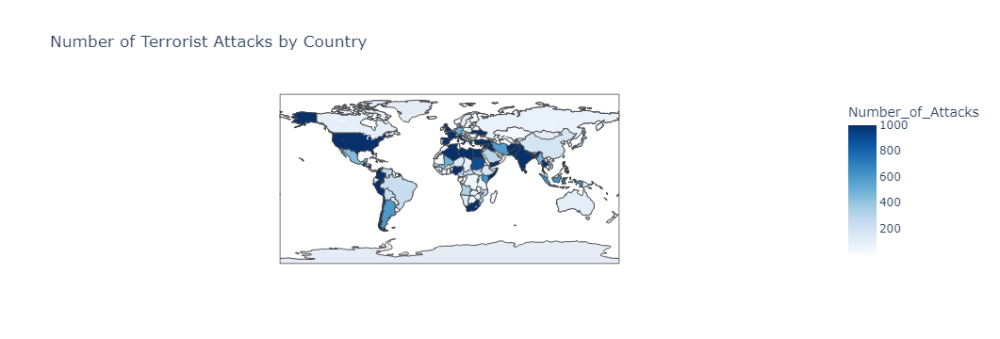

In [13]:
#World Map
geo=pd.DataFrame({'Country': data['Country'].value_counts().index,
                   'Number_of_Attacks': data['Country'].value_counts().values})

fig = px.choropleth(geo, locations="Country", 
                    locationmode="country names", color="Number_of_Attacks", 
                    hover_name="Country", range_color=[1, 1000], 
                    color_continuous_scale="blues", 
                    title='Number of Terrorist Attacks by Country')
fig.update(layout_coloraxis_showscale=True)
fig.show()

## Most Attacked Cities

In [14]:
data.City.value_counts().head(15)

City
Unknown         5540
Belfast          961
Baghdad          820
Karachi          801
Lima             704
San Salvador     630
Athens           625
Santiago         603
Bogota           581
Beirut           563
Istanbul         558
Mogadishu        518
Mosul            467
Srinagar         440
Paris            434
Name: count, dtype: int64

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



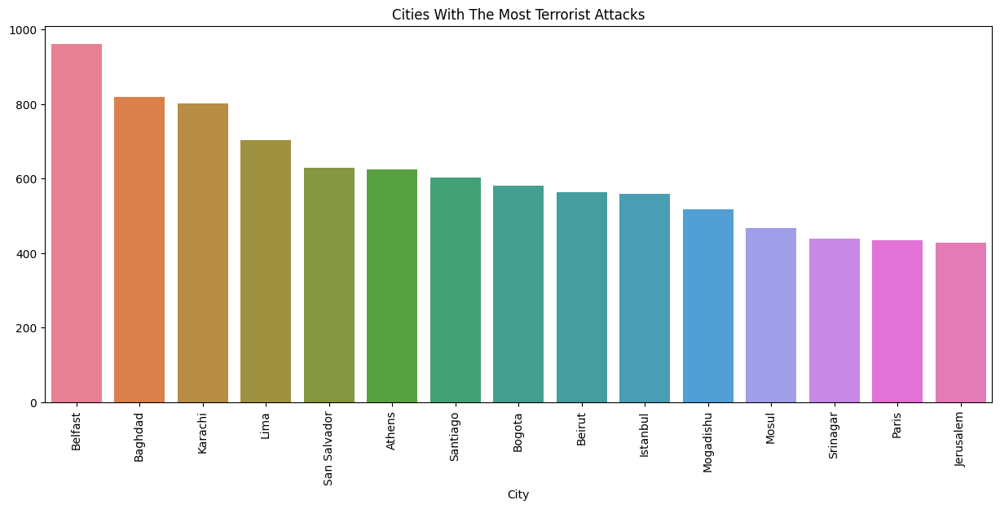

In [15]:
plt.subplots(figsize=(15, 6))
filtered = data[data['City'] != 'Unknown']
sns.barplot(x=filtered['City'].value_counts().head(15).index, 
            y=filtered['City'].value_counts().head(15).values, 
            palette="husl")
plt.xticks(rotation=90)
plt.title('Cities With The Most Terrorist Attacks')
plt.show()


## Types of Attacks

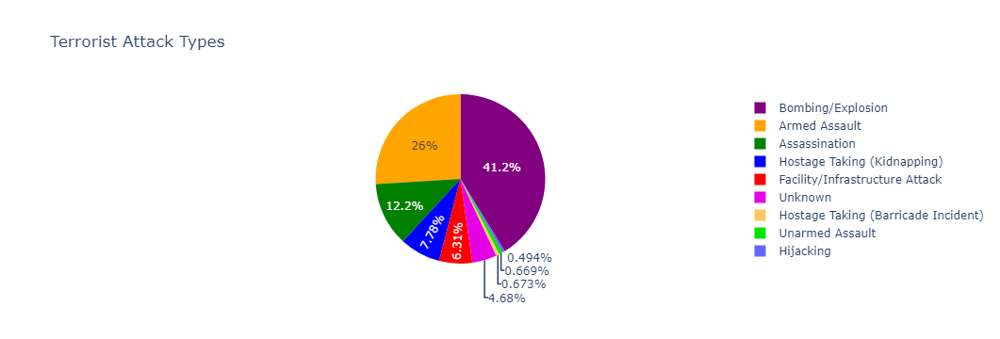

In [16]:
#Making a new column called AttackCount which is the sum of each type of terrorist attack and adding it to dataframe
data['AttackCount'] = data.Attack_Type.groupby(data.Attack_Type).transform('count')
custom_color = ['purple', 'orange', 'green', 'blue', 'red']
#Creating new Dataframe to get only Attack Type and AttackCount and dropping duplicates from Attack Type
data1 = data.copy()
data2 = data1[['Attack_Type','AttackCount']]
data3 = data2.drop_duplicates(keep='first')

#Pie Chart
fig = px.pie(data3, values="AttackCount",
             names="Attack_Type",title='Terrorist Attack Types',
             color_discrete_sequence=custom_color)
fig.show()

## Types of Weapons Used

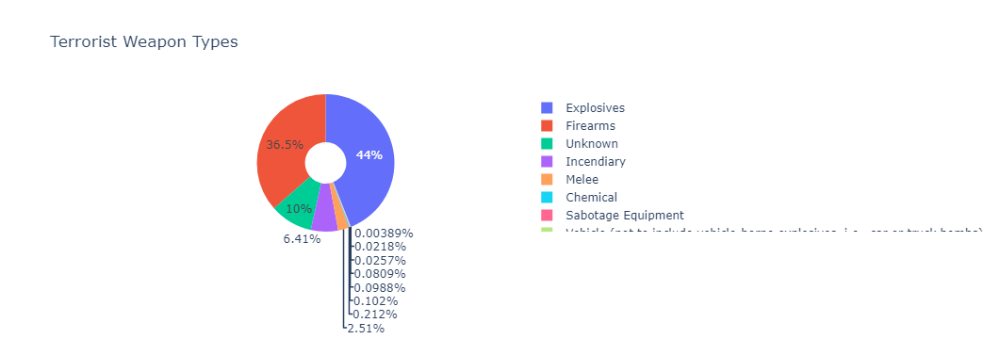

In [17]:
#Making a new column called WeaponCount which is the sum of each type of weapon and adding it to dataframe
data['WeaponCount'] = data.Weapon_Type.groupby(data.Weapon_Type).transform('count')

#Creating new Dataframe to get only Weapon Type and WeaponCount and dropping duplicates from Weapon Type
data1 = data.copy()
data2 = data1[['Weapon_Type','WeaponCount']]
data3 = data2.drop_duplicates(keep='first')

#Creating Donut Chart
labels = data3['Weapon_Type'].unique()
values = data3['WeaponCount']
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(
    title_text="Terrorist Weapon Types")
fig.show()

## Targets

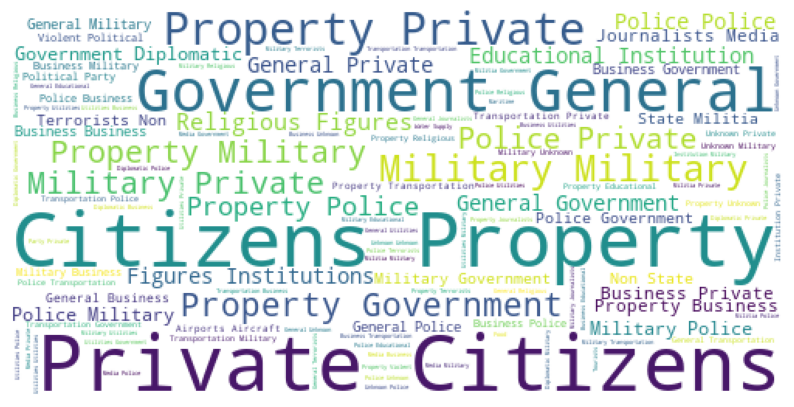

In [18]:
#Word Cloud
Targets=data.Target_Type.dropna()
plt.subplots(figsize=(10,10))
wordcloud= WordCloud(background_color='white', width=500, height = 250).generate(' '.join(Targets))
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

## Largest Terrorist Groups

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



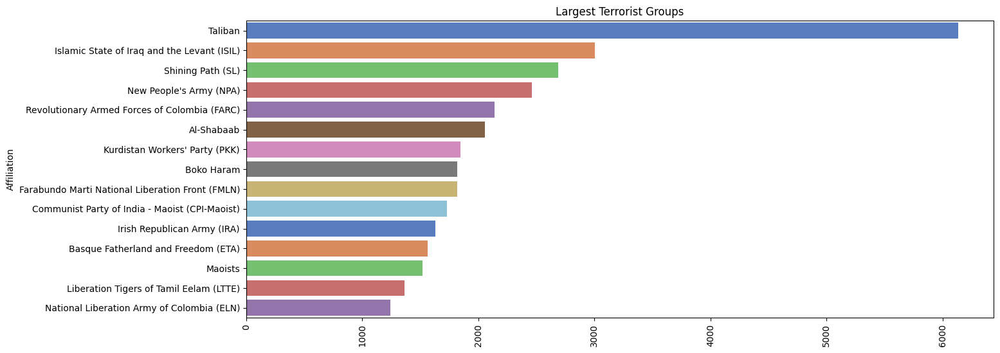

In [19]:
# Creating new dataframe without Unknown Category
filtered = data[data['Affiliation'] != 'Unknown']

# Horizontal Barplot
plt.subplots(figsize=(15,6))
sns.barplot(x=filtered['Affiliation'].value_counts().head(15).values,
            y=filtered['Affiliation'].value_counts().head(15).index, 
            palette="muted")
plt.xticks(rotation=90)
plt.title('Largest Terrorist Groups')
plt.show()


## Most Common Pakistani Terrorist Profile

In [20]:
#Subsetting data to only include entries for Pakistan
PAK = data[data['Country'] =='Pakistan']

#Removing Unknown in Affiliation
filtered = PAK[PAK['Affiliation'] != 'Unknown']

#Profile
print("Country: Pakistan")
print("Year With The Most Attacks:",PAK['Year'].value_counts().idxmax())

print("Most Common Attack Type:",PAK['Attack_Type'].value_counts().idxmax())

print("Most Common Weapon Type:",PAK['Weapon_Type'].value_counts().idxmax())

print("Most Common Target Type:",PAK['Target_Type'].value_counts().idxmax())

print('Terrorist Group with Highest Number Of Terror Attacks:', filtered['Affiliation'].value_counts().idxmax())

Country: Pakistan
Year With The Most Attacks: 2014
Most Common Attack Type: Bombing/Explosion
Most Common Weapon Type: Explosives
Most Common Target Type: Private Citizens & Property
Terrorist Group with Highest Number Of Terror Attacks: Tehrik-i-Taliban Pakistan (TTP)


In [21]:
PAK['Year'].value_counts()

Year
2014    1443
2013    1438
2012    1188
2015     958
2016     696
2011     622
2017     616
2009     479
2010     458
2008     433
2007     208
2006     145
1995     129
1991     115
1997      98
1996      90
1994      79
1992      77
2005      73
2004      63
1990      59
2001      46
1987      38
2000      38
2002      38
1988      34
1999      32
1998      30
1989      29
2003      28
1986      17
1983       8
1979       6
1982       4
1981       4
1984       3
1976       3
1975       2
1974       2
1985       2
1978       2
1980       1
1970       1
Name: count, dtype: int64

In [22]:
year_count=PAK['Year'].value_counts()

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operatin

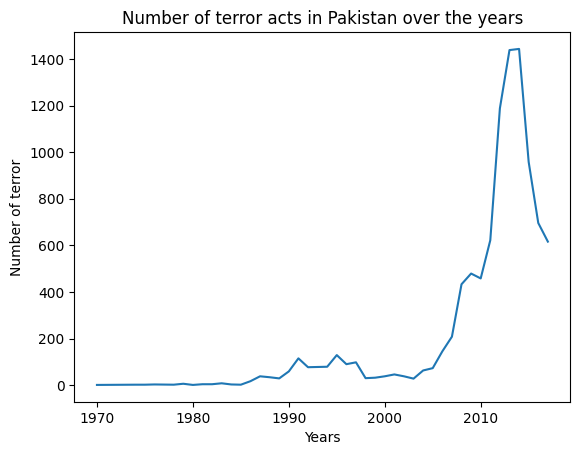

In [23]:
sns.lineplot(x=year_count.index, y=year_count.values)
plt.xlabel('Years')
plt.ylabel('Number of terror')
plt.title('Number of terror acts in Pakistan over the years')
plt.show()

In [24]:
affiliation =data[data ['Affiliation']!='Unknown']['Affiliation'].value_counts()

In [25]:
affiliation

Affiliation
Taliban                                          6133
Islamic State of Iraq and the Levant (ISIL)      3002
Shining Path (SL)                                2686
New People's Army (NPA)                          2463
Revolutionary Armed Forces of Colombia (FARC)    2142
                                                 ... 
Rival clan                                          1
Korubo Tribe                                        1
Majerten clansmen                                   1
Modakeke Ethnics                                    1
MANO-D                                              1
Name: count, Length: 3536, dtype: int64

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Dev\CVIP-Data-Science\P1-NormalTask-EDA Terrorism\edaterrorism\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



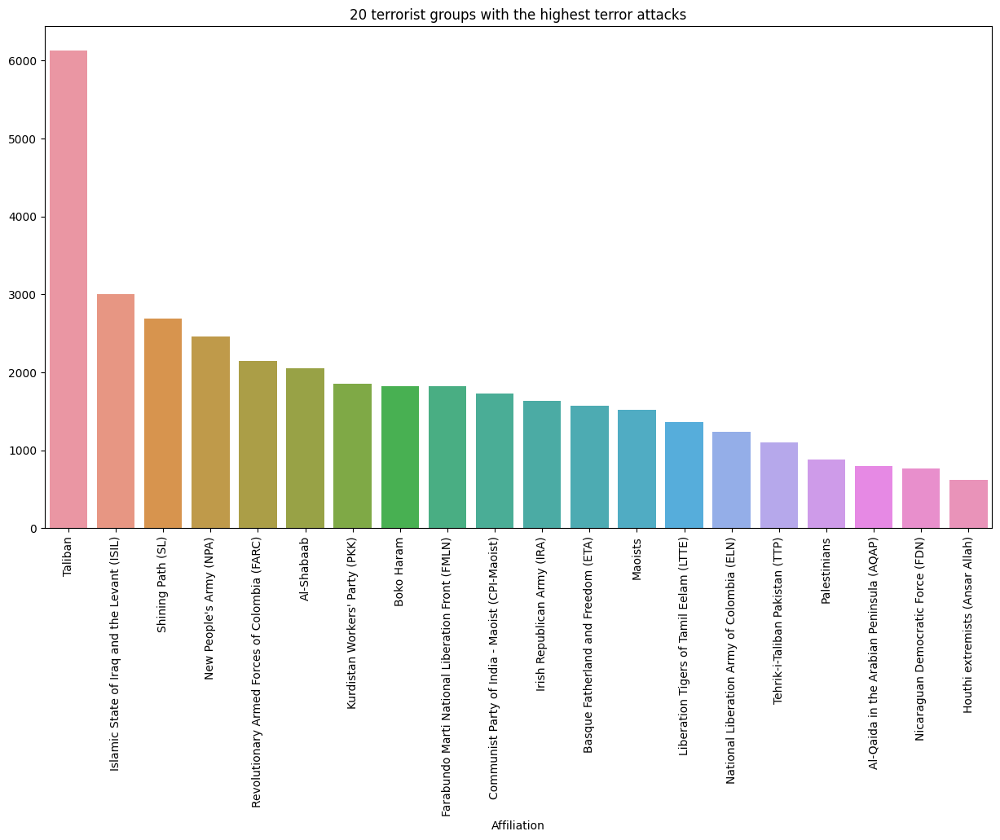

In [26]:
top_20=affiliation.head(20)
plt.figure(figsize=(15, 8))
sns.barplot(x=top_20.index, y=top_20.values)
plt.xticks(rotation=90)
plt.title('20 terrorist groups with the highest terror attacks')
plt.show()

In [27]:
PAK['Affiliation'].value_counts()

Affiliation
Unknown                            7034
Tehrik-i-Taliban Pakistan (TTP)    1088
Baloch Republican Army (BRA)        221
Baloch Liberation Front (BLF)       168
Baloch Liberation Army (BLA)        164
                                   ... 
Qari Kamran Group                     1
U/I Snipers                           1
Bhittani tribe                        1
Muslim Guerrillas                     1
Muslim United Army (MUA)              1
Name: count, Length: 146, dtype: int64

In [28]:
PAK_affiliation=PAK['Affiliation'].value_counts()

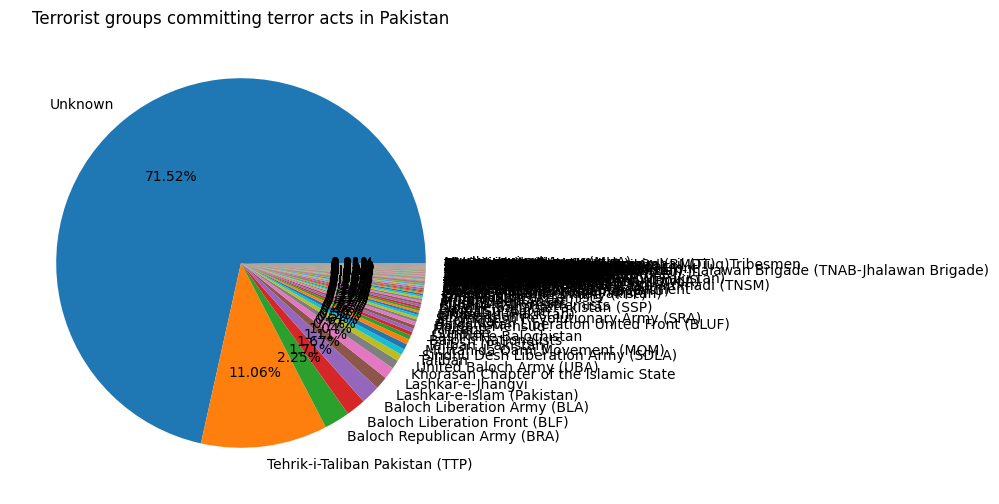

In [29]:
plt.figure(figsize=(18, 6))
langs = PAK_affiliation.index
count=PAK_affiliation.values
plt.pie(count, labels = langs, autopct='%1.2f%%')
plt.title('Terrorist groups committing terror acts in Pakistan')
plt.show()

In [30]:
country_count=data['Country'].value_counts()

In [31]:
geog=pd.DataFrame({'country':country_count.index, 'number_of_attacks':country_count.values})

In [32]:
geog.head()

,country,number_of_attacks
0,India,10499
1,Afghanistan,10137
2,Pakistan,9835
3,Iraq,9525
4,Colombia,6446
